In [ ]:
import sys
import os
sys.path.append(os.path.join(os.getcwd(), 'dinov3'))
# from huggingface_hub import notebook_login

# notebook_login()
# os.environ["HF_TOKEN"] = hf_token

Original image size: (2592, 1944) pixels


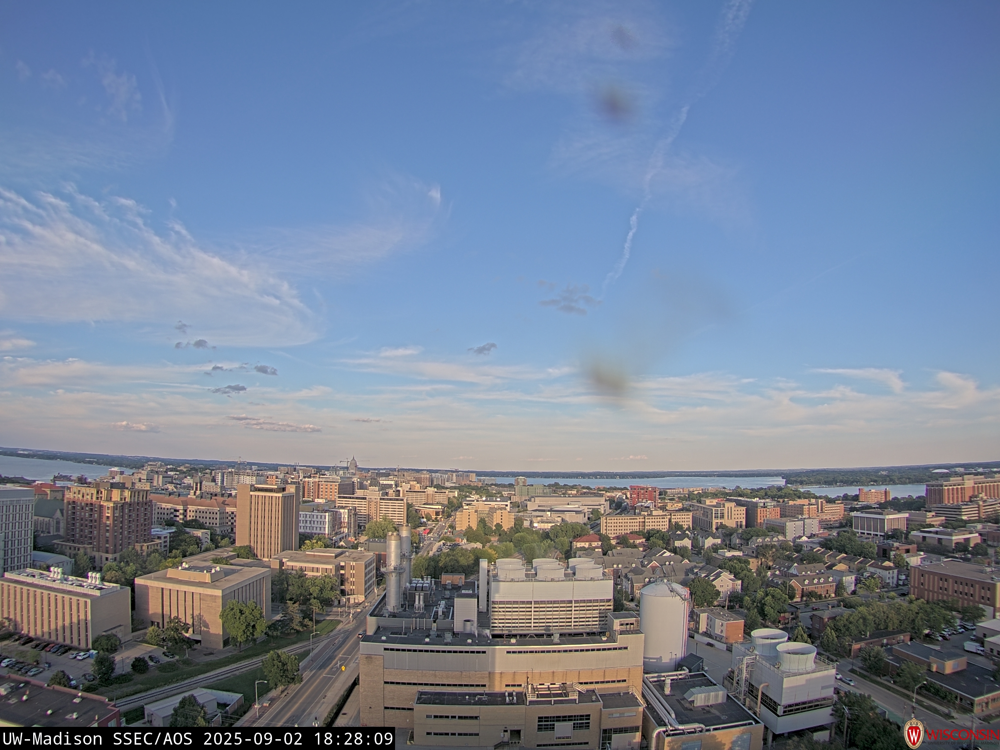

In [31]:
import urllib
from PIL import Image

def load_image_from_url(url: str) -> Image:
    with urllib.request.urlopen(url) as f:
        return Image.open(f).convert("RGB")


EXAMPLE_IMAGE_URL = "https://metobs.ssec.wisc.edu/pub/cache/aoss/cameras/east/img/2025/09/02/orig/18_28_09.trig+00.jpg"
img_pil = load_image_from_url(EXAMPLE_IMAGE_URL)
print(f"Original image size: {img_pil.size} pixels")
display(img_pil)

Splitting 2592x1944 image into 14x10 patches of 224x224
Created 140 patches


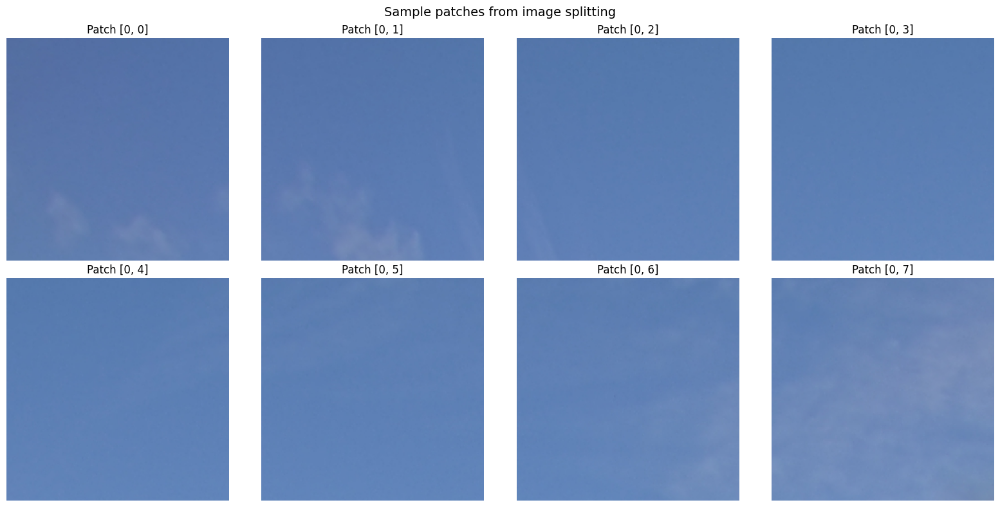

In [41]:
import numpy as np
from typing import List, Tuple

def split_image_into_patches(image: Image, patch_size: int = 224, overlap: int = 0) -> List[Tuple[Image.Image, int, int]]:
    """
    Split an image into patches of specified size with optional overlap.
    
    Args:
        image: PIL Image to split
        patch_size: Size of each patch (assumes square patches)
        overlap: Number of pixels to overlap between patches
    
    Returns:
        List of tuples containing (patch_image, row_idx, col_idx)
    """
    width, height = image.size
    patches = []
    
    # Calculate step size (patch_size - overlap)
    step_size = patch_size - overlap
    
    # Calculate number of patches in each direction
    num_patches_x = (width - overlap) // step_size + (1 if (width - overlap) % step_size > 0 else 0)
    num_patches_y = (height - overlap) // step_size + (1 if (height - overlap) % step_size > 0 else 0)
    
    print(f"Splitting {width}x{height} image into {num_patches_x}x{num_patches_y} patches of {patch_size}x{patch_size}")
    
    for row in range(num_patches_y):
        for col in range(num_patches_x):
            # Calculate patch coordinates
            x_start = col * step_size
            y_start = row * step_size
            
            # Ensure we don't exceed image boundaries
            x_end = min(x_start + patch_size, width)
            y_end = min(y_start + patch_size, height)
            
            # If patch would be too small, adjust start position
            if x_end - x_start < patch_size:
                x_start = max(0, x_end - patch_size)
            if y_end - y_start < patch_size:
                y_start = max(0, y_end - patch_size)
            
            # Extract patch
            patch = image.crop((x_start, y_start, x_end, y_end))
            
            # If patch is smaller than required size, pad it
            if patch.size != (patch_size, patch_size):
                padded_patch = Image.new('RGB', (patch_size, patch_size), (0, 0, 0))
                padded_patch.paste(patch, (0, 0))
                patch = padded_patch
            
            patches.append((patch, row, col))
    
    return patches

# Split the image into patches
patches = split_image_into_patches(img_pil, patch_size=224, overlap=32)
print(f"Created {len(patches)} patches")

# Display first few patches to verify
import matplotlib.pyplot as plt
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()

for i, (patch, row, col) in enumerate(patches[:8]):
    axes[i].imshow(patch)
    axes[i].set_title(f"Patch [{row}, {col}]")
    axes[i].axis('off')

plt.suptitle("Sample patches from image splitting", fontsize=14)
plt.tight_layout()
plt.show()

In [45]:
def process_patches_and_combine(patches: List[Tuple[Image.Image, int, int]], 
                                model, tokenizer, texts, device, 
                                original_size: Tuple[int, int],
                                patch_size: int = 224) -> torch.Tensor:
    """
    Process all image patches and combine the results into a high-resolution heatmap.
    
    Args:
        patches: List of (patch_image, row_idx, col_idx) tuples
        model: The DINOTxt model
        tokenizer: Text tokenizer
        texts: List of text descriptions
        device: Computing device
        original_size: (width, height) of original image
        patch_size: Size of each patch
    
    Returns:
        Combined heatmap tensor of shape [num_texts, original_height, original_width]
    """
    from dinov3.data.transforms import make_classification_eval_transform
    import torch.nn.functional as F
    
    image_preprocess = make_classification_eval_transform()
    tokenized_texts_tensor = tokenizer.tokenize(texts).to(device)
    
    # Calculate grid dimensions
    max_row = max(patch[1] for patch in patches)
    max_col = max(patch[2] for patch in patches)
    grid_rows = max_row + 1
    grid_cols = max_col + 1
    
    # Initialize combined heatmap
    patch_grid_size = patch_size // 16  # DINOv3 patch size is 16x16
    combined_height = grid_rows * patch_grid_size
    combined_width = grid_cols * patch_grid_size
    
    print(f"Processing {len(patches)} patches...")
    print(f"Each patch {patch_size}x{patch_size} -> {patch_grid_size}x{patch_grid_size} feature grid")
    print(f"Combined heatmap size: {len(texts)} texts x {combined_height}x{combined_width}")
    
    # Initialize combined heatmap
    combined_heatmap = torch.zeros(len(texts), combined_height, combined_width, device=device)
    patch_counts = torch.zeros(combined_height, combined_width, device=device)  # For averaging overlaps
    
    for i, (patch, row, col) in enumerate(patches):
        if i % 10 == 0:
            print(f"Processing patch {i+1}/{len(patches)}")
        
        # Preprocess patch
        patch_tensor = torch.stack([image_preprocess(patch)], dim=0).to(device)
        
        with torch.autocast(device_type=device.type, dtype=torch.float):
            with torch.no_grad():
                # Get patch features
                image_class_tokens, image_patch_tokens, backbone_patch_tokens = model.encode_image_with_patch_tokens(patch_tensor)
                text_features_aligned = model.encode_text(tokenized_texts_tensor)[:, 1024:]  # Aligned to patch features
        
        # Calculate similarity for this patch
        B, P, D = image_patch_tokens.shape
        H = W = int(P**0.5) 
        
        x = image_patch_tokens.movedim(2, 1).unflatten(2, (H, W)).float()  # [B, D, H, W]
        x = F.normalize(x, p=2, dim=1)
        y = F.normalize(text_features_aligned.float(), p=2, dim=1)
        patch_similarity = torch.einsum("bdhw,cd->bchw", x, y)  # [1, num_texts, H, W]
        
        # Add to combined heatmap
        row_start = row * patch_grid_size
        col_start = col * patch_grid_size
        row_end = min(row_start + H, combined_height)
        col_end = min(col_start + W, combined_width)
        
        combined_heatmap[:, row_start:row_end, col_start:col_end] += patch_similarity[0, :, :row_end-row_start, :col_end-col_start]
        patch_counts[row_start:row_end, col_start:col_end] += 1
    
    # Average overlapping regions
    patch_counts[patch_counts == 0] = 1  # Avoid division by zero
    combined_heatmap = combined_heatmap / patch_counts.unsqueeze(0)
    
    # Resize to match original image proportions
    original_width, original_height = original_size
    combined_heatmap_resized = combined_heatmap
    
    return combined_heatmap_resized

# Process all patches and generate high-resolution heatmap
print("Starting patch-based processing...")
high_res_heatmap = process_patches_and_combine(
    patches, model, tokenizer, texts, device, img_pil.size
)

print(f"High-resolution heatmap shape: {high_res_heatmap.shape}")  # [num_texts, height, width]

Starting patch-based processing...
Processing 140 patches...
Each patch 224x224 -> 14x14 feature grid
Combined heatmap size: 1 texts x 140x196
Processing patch 1/140
Processing patch 11/140
Processing patch 11/140
Processing patch 21/140
Processing patch 21/140
Processing patch 31/140
Processing patch 31/140
Processing patch 41/140
Processing patch 41/140
Processing patch 51/140
Processing patch 51/140
Processing patch 61/140
Processing patch 61/140
Processing patch 71/140
Processing patch 71/140
Processing patch 81/140
Processing patch 81/140
Processing patch 91/140
Processing patch 91/140
Processing patch 101/140
Processing patch 101/140
Processing patch 111/140
Processing patch 111/140
Processing patch 121/140
Processing patch 121/140
Processing patch 131/140
Processing patch 131/140
High-resolution heatmap shape: torch.Size([1, 140, 196])
High-resolution heatmap shape: torch.Size([1, 140, 196])


In [49]:
# Visualize high-resolution heatmaps
import matplotlib.pyplot as plt

class_names = ["contrails"]

fig, axes = plt.subplots(2, 1, figsize=(100, 100))

# First row: Original image with overlaid heatmap
ax = axes[0]
ax.imshow(img_pil)
heatmap = high_res_heatmap[0].cpu().numpy()
im = ax.imshow(heatmap, alpha=0.6, cmap='hot', vmin=0, vmax=heatmap.max()*0.8)
ax.set_title(f'Overlay: {class_names[0]}')
ax.axis('off')
plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

# Second row: Heatmap only
ax = axes[1]
im = ax.imshow(heatmap, cmap='magma', vmin=0, vmax=heatmap.max())
ax.set_title(f'Heatmap: {class_names[0]}')
ax.axis('off')
plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

plt.suptitle(f'High-Resolution Heatmaps from Patch Processing\n' +
             f'Original: {img_pil.size[0]}×{img_pil.size[1]} → Processed as {len(patches)} patches of 224×224',
             fontsize=16)
plt.tight_layout()
plt.show()

# Print statistics
print(f"\nProcessing Statistics:")
print(f"Original image size: {img_pil.size}")
print(f"Number of patches: {len(patches)}")
print(f"Patch size: 224×224 pixels")
print(f"Final heatmap resolution: {high_res_heatmap.shape[1]}×{high_res_heatmap.shape[2]}")
print(f"Resolution improvement: {(high_res_heatmap.shape[1] * high_res_heatmap.shape[2]) / (224 * 224):.1f}x compared to single 224×224 processing")



Processing Statistics:
Original image size: (2592, 1944)
Number of patches: 140
Patch size: 224×224 pixels
Final heatmap resolution: 140×196
Resolution improvement: 0.5x compared to single 224×224 processing


Processing single resized image for comparison...
Single image patch grid: 14×14 patches
Single image patch grid: 14×14 patches


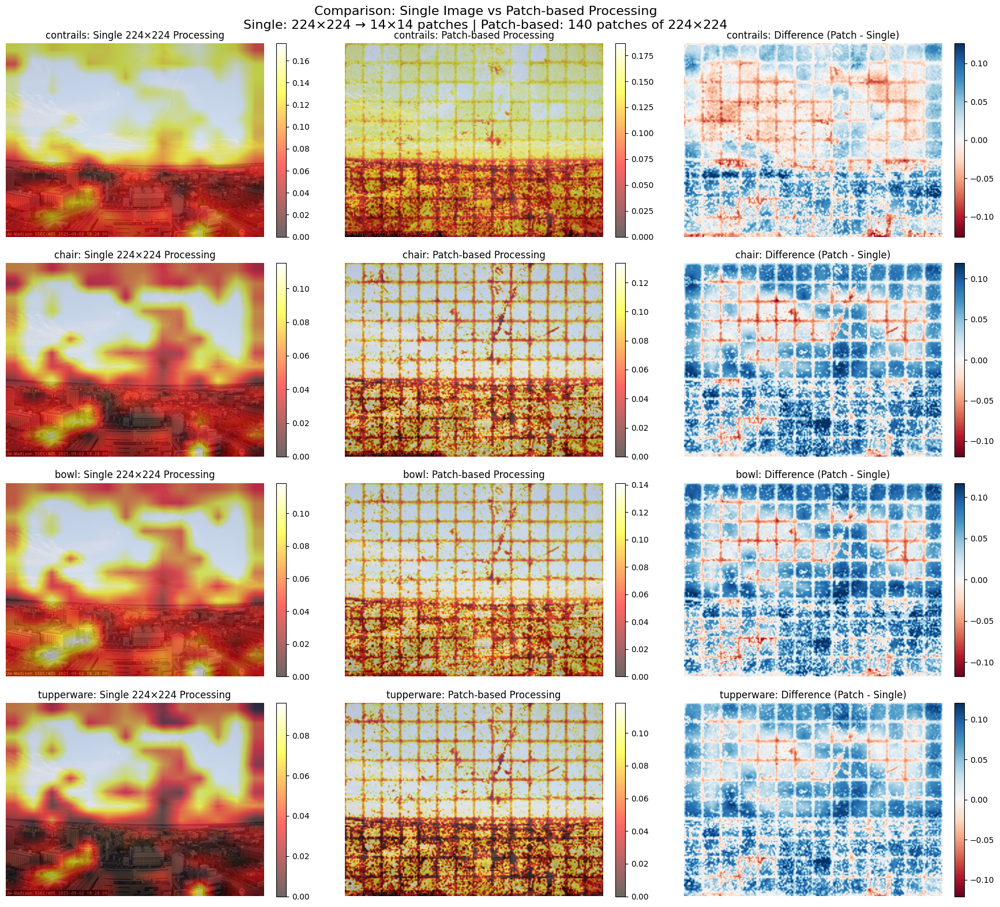


Comparison Summary:
Single image processing: 224×224 input → 14×14 feature grid = 196 features
Patch-based processing: 140 patches of 224×224 → Combined 1944×2592 heatmap
Feature resolution improvement: 25708.4x


In [35]:
# Compare single image processing vs patch-based processing
from dinov3.data.transforms import make_classification_eval_transform
import torch.nn.functional as F

print("Processing single resized image for comparison...")

# Process the entire image at 224x224 for comparison
img_resized_224 = img_pil.resize((224, 224))
image_preprocess = make_classification_eval_transform()
single_image_tensor = torch.stack([image_preprocess(img_resized_224)], dim=0).to(device)

with torch.autocast(device_type=device.type, dtype=torch.float):
    with torch.no_grad():
        single_image_class_tokens, single_image_patch_tokens, single_backbone_patch_tokens = model.encode_image_with_patch_tokens(single_image_tensor)
        text_features_aligned_to_patch = model.encode_text(tokenizer.tokenize(texts).to(device))[:, 1024:]

# Calculate similarity for single image
B, P, D = single_image_patch_tokens.shape
H = W = int(P**0.5) 
print(f"Single image patch grid: {H}×{W} patches")

x_single = single_image_patch_tokens.movedim(2, 1).unflatten(2, (H, W)).float()
x_single = F.normalize(x_single, p=2, dim=1)
y_single = F.normalize(text_features_aligned_to_patch.float(), p=2, dim=1)
single_similarity = torch.einsum("bdhw,cd->bchw", x_single, y_single)

# Resize single image heatmap to match original image size for comparison
single_heatmap_resized = F.interpolate(
    single_similarity, 
    size=(img_pil.size[1], img_pil.size[0]), 
    mode='bilinear', 
    align_corners=False
).squeeze(0)

# Visualize comparison
fig, axes = plt.subplots(len(texts), 3, figsize=(18, 4*len(texts)))

for i, text in enumerate(texts):
    # Original with single image heatmap
    axes[i, 0].imshow(img_pil)
    single_hm = single_heatmap_resized[i].cpu().numpy()
    im1 = axes[i, 0].imshow(single_hm, alpha=0.6, cmap='hot', vmin=0, vmax=single_hm.max()*0.8)
    axes[i, 0].set_title(f'{class_names[i]}: Single 224×224 Processing')
    axes[i, 0].axis('off')
    plt.colorbar(im1, ax=axes[i, 0], fraction=0.046, pad=0.04)
    
    # Original with patch-based heatmap
    axes[i, 1].imshow(img_pil)
    patch_hm = high_res_heatmap[i].cpu().numpy()
    im2 = axes[i, 1].imshow(patch_hm, alpha=0.6, cmap='hot', vmin=0, vmax=patch_hm.max()*0.8)
    axes[i, 1].set_title(f'{class_names[i]}: Patch-based Processing')
    axes[i, 1].axis('off')
    plt.colorbar(im2, ax=axes[i, 1], fraction=0.046, pad=0.04)
    
    # Difference heatmap
    # Resize single heatmap to match patch heatmap resolution for comparison
    single_resized_for_diff = F.interpolate(
        single_heatmap_resized[i:i+1].unsqueeze(0), 
        size=(high_res_heatmap.shape[1], high_res_heatmap.shape[2]), 
        mode='bilinear', 
        align_corners=False
    ).squeeze()
    
    diff = (high_res_heatmap[i] - single_resized_for_diff).cpu().numpy()
    im3 = axes[i, 2].imshow(diff, cmap='RdBu', vmin=-np.abs(diff).max()*0.8, vmax=np.abs(diff).max()*0.8)
    axes[i, 2].set_title(f'{class_names[i]}: Difference (Patch - Single)')
    axes[i, 2].axis('off')
    plt.colorbar(im3, ax=axes[i, 2], fraction=0.046, pad=0.04)

plt.suptitle(f'Comparison: Single Image vs Patch-based Processing\n' + 
             f'Single: {224}×{224} → {H}×{H} patches | Patch-based: {len(patches)} patches of 224×224', 
             fontsize=16)
plt.tight_layout()
plt.show()

print(f"\nComparison Summary:")
print(f"Single image processing: 224×224 input → {H}×{H} feature grid = {H*H} features")
print(f"Patch-based processing: {len(patches)} patches of 224×224 → Combined {high_res_heatmap.shape[1]}×{high_res_heatmap.shape[2]} heatmap")
print(f"Feature resolution improvement: {(high_res_heatmap.shape[1] * high_res_heatmap.shape[2]) / (H * H):.1f}x")

In [36]:
from dinov3.hub.dinotxt import dinov3_vitl16_dinotxt_tet1280d20h24l
model, tokenizer = dinov3_vitl16_dinotxt_tet1280d20h24l(weights="/Users/shrenikborad/Downloads/dinov3_vitl16_dinotxt_vision_head_and_text_encoder-a442d8f5.pth", backbone_weights="/Users/shrenikborad/Downloads/dinov3_vitl16_pretrain_lvd1689m-8aa4cbdd.pth")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.0262864].


Input image tensor shape: torch.Size([1, 3, 224, 224])


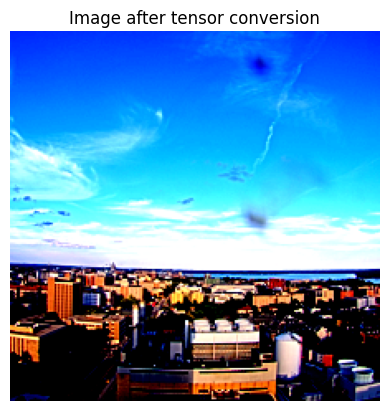

Image feature shape: torch.Size([1, 2048])
Text feature shape: torch.Size([1, 2048])
[[0.13004048]]


/var/folders/nk/x5y68p8n5v529rrl_01kmfh80000gn/T/ipykernel_52048/915742938.py:29: RuntimeWarning: divide by zero encountered in matmul
  text_features.cpu().float().numpy() @ image_features.cpu().float().numpy().T
/var/folders/nk/x5y68p8n5v529rrl_01kmfh80000gn/T/ipykernel_52048/915742938.py:29: RuntimeWarning: overflow encountered in matmul
  text_features.cpu().float().numpy() @ image_features.cpu().float().numpy().T
/var/folders/nk/x5y68p8n5v529rrl_01kmfh80000gn/T/ipykernel_52048/915742938.py:29: RuntimeWarning: invalid value encountered in matmul
  text_features.cpu().float().numpy() @ image_features.cpu().float().numpy().T


In [40]:
import torch
from dinov3.data.transforms import make_classification_eval_transform

device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")

image_preprocess = make_classification_eval_transform()
image_tensor = torch.stack([image_preprocess(img_pil)], dim=0).to(device)
print(f"Input image tensor shape: {image_tensor.shape}")
# show image after tensor conversion
import matplotlib.pyplot as plt
plt.imshow(image_tensor[0].cpu().permute(1, 2, 0).numpy())
plt.title("Image after tensor conversion")
plt.axis("off")
plt.show()

texts = ["contrails"]
class_names = ["contrails"]
tokenized_texts_tensor = tokenizer.tokenize(texts).to(device)
model = model.to(device).eval()
with torch.autocast(device_type=device.type, dtype=torch.float):
    with torch.no_grad():
        image_features = model.encode_image(image_tensor)
        text_features = model.encode_text(tokenized_texts_tensor)
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
print(f"Image feature shape: {image_features.shape}")
print(f"Text feature shape: {text_features.shape}")
similarity = (
    text_features.cpu().float().numpy() @ image_features.cpu().float().numpy().T
)
print(similarity) 

In [38]:
with torch.autocast(device_type="mps", dtype=torch.float):
    with torch.no_grad():
        image_class_tokens, image_patch_tokens, backbone_patch_tokens = model.encode_image_with_patch_tokens(image_tensor)
        text_features_aligned_to_patch = model.encode_text(tokenized_texts_tensor)[:, 1024:] # Part of text features that is aligned to patch features

Image patch tokens shape: torch.Size([1, 196, 1024])
Actual patch grid: 14×14 patches (total: 196)
From 896×896 input → 14×14 patch grid
Memory usage scales as O(H²) = O(196) vs O(28²) = O(784) for standard 448×448
Heatmap resolution: torch.Size([1, 4, 14, 14])
Heatmap resolution: torch.Size([1, 4, 14, 14])


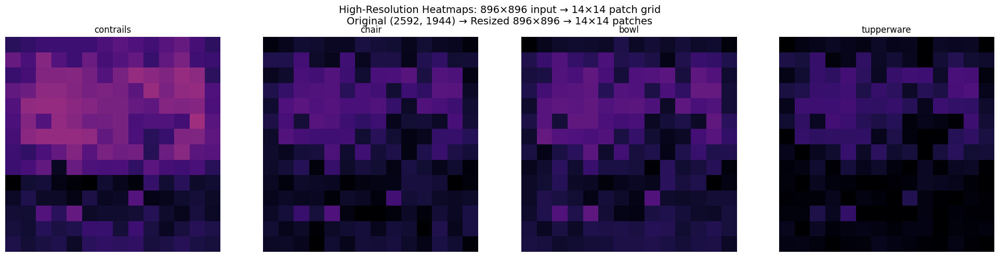


Memory scaling comparison:
224×224 → 14×14 = 196 patches (1x baseline)
448×448 → 28×28 = 784 patches (4x baseline)
896×896 → 14×14 = 196 patches (1.0x baseline)


In [39]:
import torch.nn.functional as F

B, P, D = image_patch_tokens.shape
print(f"Image patch tokens shape: {backbone_patch_tokens.shape}")  # [B, P, D]
H = W = int(P**0.5) 
print(f"Actual patch grid: {H}×{W} patches (total: {P})")
print(f"From {target_size}×{target_size} input → {H}×{W} patch grid")
print(f"Memory usage scales as O(H²) = O({H**2}) vs O(28²) = O(784) for standard 448×448")

x = image_patch_tokens.movedim(2, 1).unflatten(2, (H, W)).float()  # [B, D, H, W]
x = F.normalize(x, p=2, dim=1)
y = F.normalize(text_features_aligned_to_patch.float(), p=2, dim=1)
per_patch_similarity_to_text = torch.einsum("bdhw,cd->bchw", x, y)
print(f"Heatmap resolution: {per_patch_similarity_to_text.shape}")  # [B, C, H, W]

import matplotlib.pyplot as plt
fig, axes = plt.subplots(1, len(texts), figsize=(20, 5))
for i, ax in enumerate(axes):
    # Much finer-grained heatmap due to higher input resolution
    ax.imshow(per_patch_similarity_to_text[0, i].cpu(), cmap="magma", vmin=0, vmax=0.5)
    ax.set_title(f"{class_names[i]}")
    ax.axis("off")

plt.suptitle(f"High-Resolution Heatmaps: {target_size}×{target_size} input → {H}×{H} patch grid\n" + 
             f"Original {img_pil.size} → Resized {target_size}×{target_size} → {H}×{H} patches", 
             fontsize=14)
plt.tight_layout()
plt.show()

# Show the memory scaling
print(f"\nMemory scaling comparison:")
print(f"224×224 → 14×14 = 196 patches (1x baseline)")
print(f"448×448 → 28×28 = 784 patches (4x baseline)")  
print(f"{target_size}×{target_size} → {H}×{H} = {H**2} patches ({H**2/196:.1f}x baseline)")